## Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

---
## First, I'll compute the camera calibration using chessboard images

In [1]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
%matplotlib inline

# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
chessboards = glob.glob('./camera_cal/calibration*.jpg')

# Step through the list and search for chessboard corners
for fname in chessboards:
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6),None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        # Draw and display the corners
        cv2.imshow('img',cv2.drawChessboardCorners(img, (9,6), corners, ret))

In [2]:
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1],None,None)
undist = cv2.undistort(img, mtx, dist, None, mtx)

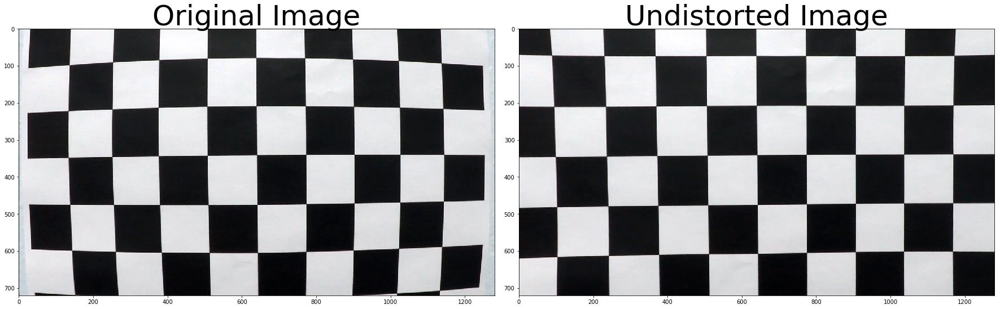

In [3]:
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(undist)
ax2.set_title('Undistorted Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

In [5]:
def show_images(images, cols = 1, titles = None, bgr=False):
    assert((titles is None)or (len(images) == len(titles)))
    n_images = len(images)
    if titles is None: titles = ['Image (%d)' % i for i in range(1,n_images + 1)]
    fig = plt.figure()
    for n, (image, title) in enumerate(zip(images, titles)):
        a = fig.add_subplot(cols, np.ceil(n_images/float(cols)), n + 1)
        if image.ndim == 2:
            plt.gray()
        if bgr == True:
            plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
        else:
            plt.imshow(image)
        a.set_title(title)
    fig.set_size_inches(np.array(fig.get_size_inches()) * n_images)
    plt.show()
    
def toRgb(image):
    return cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

def getHls(image):
    hls = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)    
    return hls[:,:,0], hls[:,:,1], hls[:,:,2]

def getHsv(image):
    hsv = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)    
    return hsv[:,:,0], hsv[:,:,1], hsv[:,:,2]

# Apply a distortion correction to raw images

In [4]:
test_images_names = glob.glob('./test_images/test*.jpg')

test_images = []
for test_name in test_images_names:
    test_images.append(cv2.imread(test_name))
    
test_undist = []
for test_image in test_images:
    test_undist.append(cv2.undistort(test_image, mtx, dist, None, None))

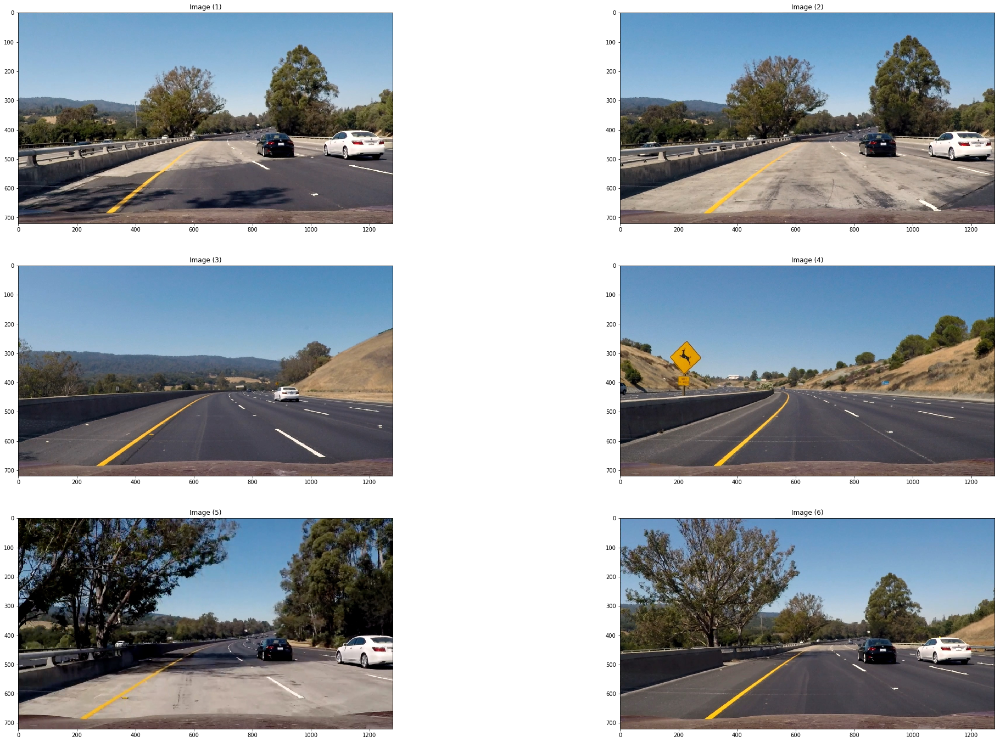

In [6]:
show_images(test_images, 3, None, True)

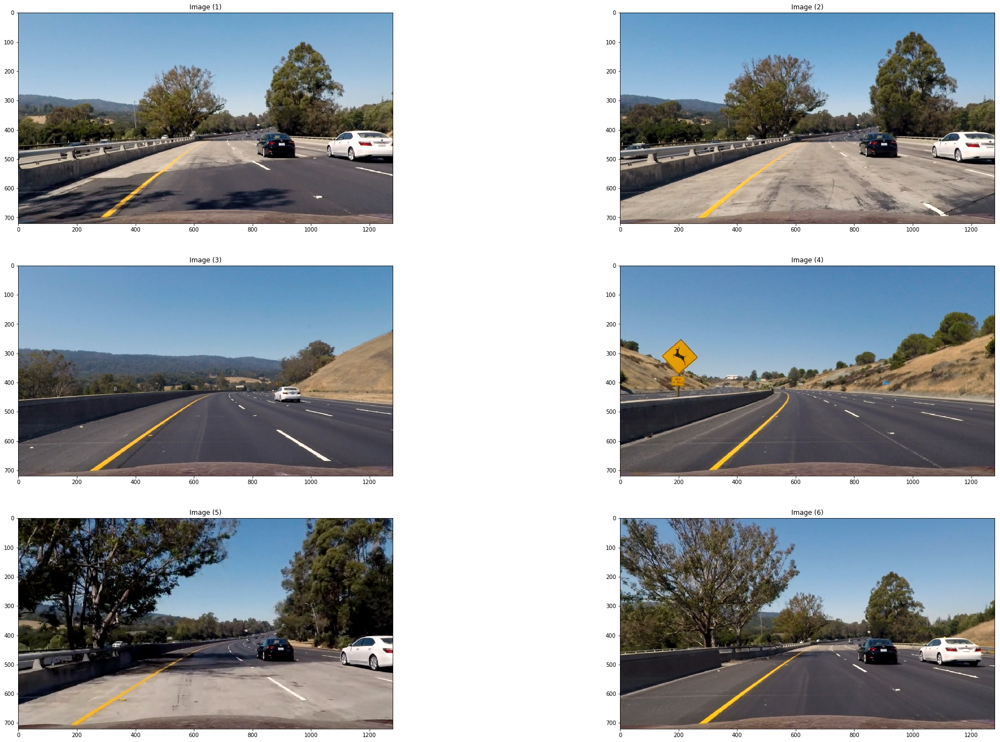

In [7]:
show_images(test_undist, 3, None, True)

# Color transform, gradients to create a thresholded binary image

In [ ]:
def filter(image, mask):
    image = cv2.bitwise_and(image, image, mask=mask).astype(np.uint8)
    image = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    
    thresh = 10
    
    filtered = np.zeros_like(image)
    filtered[image >= thresh] = 1
    
    return filtered

def gamma(image):
    gamma = 1.5

    invGamma = 1.0 / gamma
    table = np.array([((i / 255.0) ** invGamma) * 255
    for i in np.arange(0, 256)]).astype("uint8")
 
    return cv2.LUT(image, table)

def colorTransform(image):
    light_img = gamma(image)
    
    w_lower = np.array([110, 110, 205], dtype = "uint8")
    w_upper = np.array([255, 255, 255], dtype = "uint8")
    white_mask = cv2.inRange(image, w_lower, w_upper)

    white_image = filter(image, white_mask)
    
    #yellow lighten to beat shade
    y_lower = np.array([210, 165, 0], dtype = "uint8")
    y_upper = np.array([255, 255, 170], dtype = "uint8")
    
    yellow_lighten_mask = cv2.inRange(light_img, y_lower, y_upper)    
    yellow_image = filter(image, yellow_lighten_mask)

    _,_,v_channel = getHsv(image)
    _,_,s_channel = getHls(image)
    
    img = np.zeros_like(white_image)
    img[(white_image == 1) | (yellow_image == 1) | (v_channel >= 235) | (s_channel >= 235)] = 1
    
    return img

In [8]:
result_images = []
for test_img in test_undist:
    result_images.append(colorTransform(toRgb(test_img)))

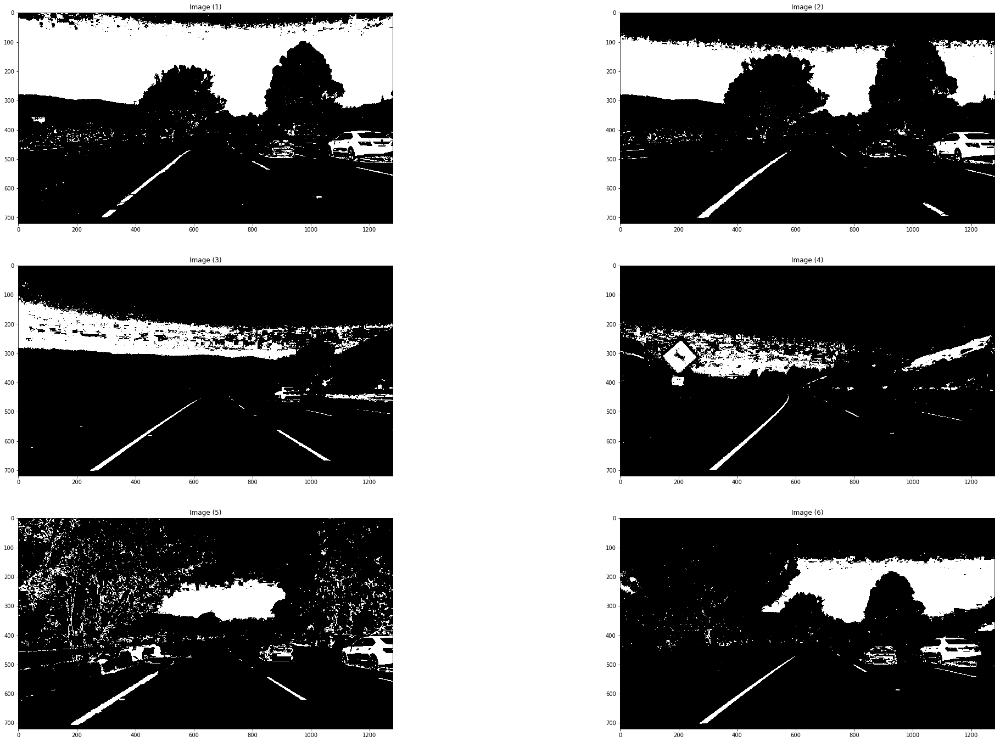

In [67]:
show_images(result_images,3)

In [10]:
#gradient
def gradient(image, axe='x', thresh=(50,150), sobel_kernel=3):
    if axe == 'x':
        param = (1,0)
    else:
        param = (0,1)
    abs_sobel = np.absolute(cv2.Sobel(image, cv2.CV_64F, param[0], param[1], ksize=sobel_kernel)) # Take the derivative in x
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    
    binary = np.zeros_like(scaled_sobel)
    binary[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1
    
    return binary

def gradmag(image, thresh=(0,255), sobel_kernel=3):
    sobelx = cv2.Sobel(image, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(image, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8)

    binary = np.zeros_like(gradmag)
    binary[(gradmag >= thresh[0]) & (gradmag <= thresh[1])] = 1
    
    return binary

def graddirect(image, thresh=(0.5, 1.2), sobel_kernel = 3):
    sobelx = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    
    binary =  np.zeros_like(absgraddir)
    binary[(absgraddir >= thresh[0]) & (absgraddir <= thresh[1])] = 1
    
    return binary

def combi(image, thresh=(50,150)):
    sobelX = gradient(image, 'x', thresh)
    sobelY = gradient(image, 'y', thresh)
    mag = gradmag(image, thresh)
    direction = graddirect(image)

    combined = np.zeros_like(sobelX) 
    combined[((sobelX == 1) & (sobelY == 1)) | (mag == 1)] = 1
    
    return combined

In [11]:
sobel_kernel=3
thresh=(50, 255)
binary_list = []
for img in result_images:
    binary_list.append(gradient(img, 'x', thresh))
    binary_list.append(gradient(img, 'y', thresh))
    binary_list.append(gradmag(img, thresh))
    binary_list.append(graddirect(img))

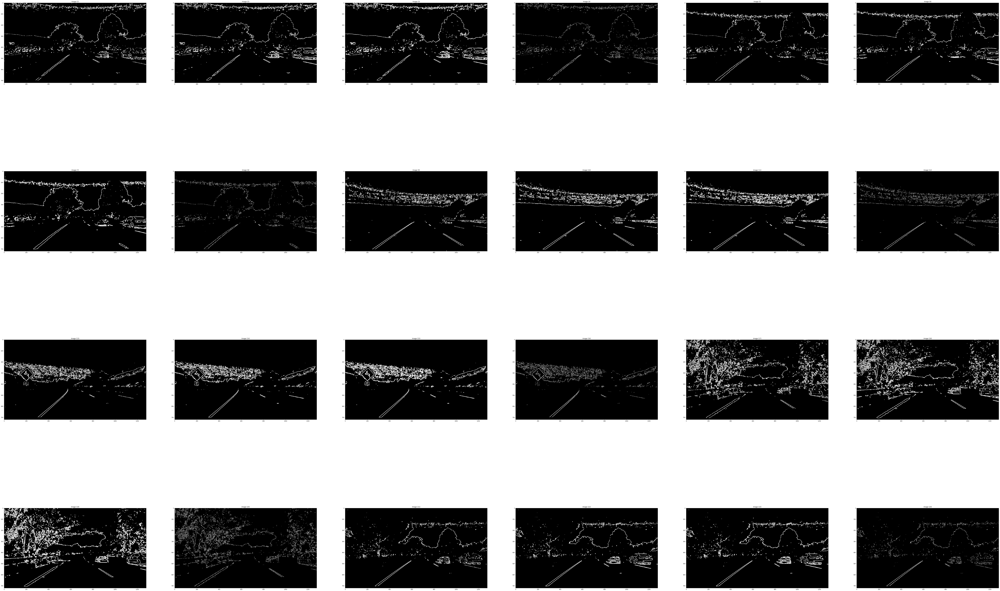

In [12]:
# see results of various gradient mehods
show_images(binary_list, 4)

In [14]:
#I'm using straight image to be able set correct values for warping. Correct parameters mean to have 2 straight lines
straight_image_names = glob.glob('./test_images/straight*.jpg')
straight_images = []
for name in straight_image_names:
    img = cv2.imread(name)
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    straight_images.append(undist)

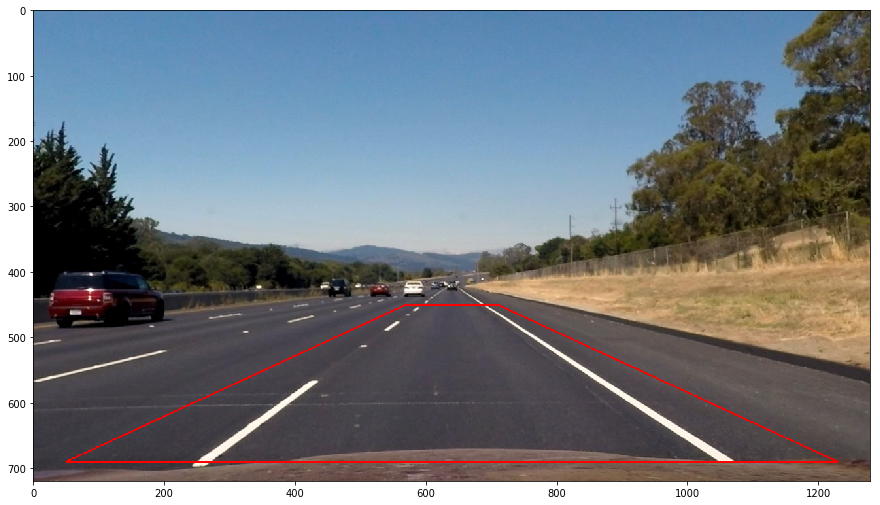

In [15]:
img2warp = toRgb(straight_images[0])
img_line = np.copy(img2warp)
img_size = (straight_images[0].shape[1], straight_images[0].shape[0])
color = [255,0,0,]
width = 2

top = 450

point1 = (50,img_size[1]-30)
point2 = (570,top)
point3 = (710,top)
point4 = (img_size[0]-50,img_size[1]-30)

cv2.line(img_line, point1,point2, color, width)
cv2.line(img_line, point2,point3, color, width)
cv2.line(img_line, point3,point4, color, width)
cv2.line(img_line, point4,point1, color, width)

fig, ax = plt.subplots(figsize=(15,30))
ax.imshow(img_line)

src = np.float32([
         point2, 
         point3, 
         point4, 
         point1])
    
offset = 100
dst = np.float32([
    [offset, 0],
    [img2warp.shape[1]-offset, 0],
    [img2warp.shape[1]-offset, img2warp.shape[0]], 
    [offset, img2warp.shape[0]]
])
#set transform matrixes
M = cv2.getPerspectiveTransform(src, dst)
Minv = cv2.getPerspectiveTransform(dst, src)

In [16]:
#2,3,4,1
def warp(image,M):
    
    warped = cv2.warpPerspective(image, M,(image.shape[1], image.shape[0]))
    
    return warped

In [17]:
warped = warp(img2warp, M)

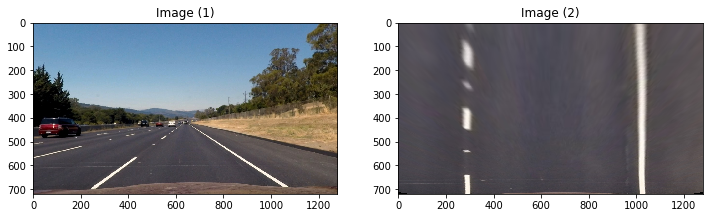

In [18]:
show_images([img2warp,warped])

In [21]:
binary_warped = combi(colorTransform(warped), (20, 255))

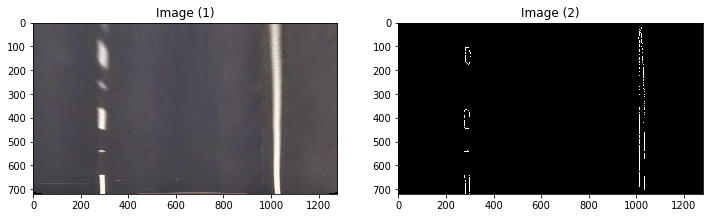

In [22]:
show_images([warped, binary_warped])

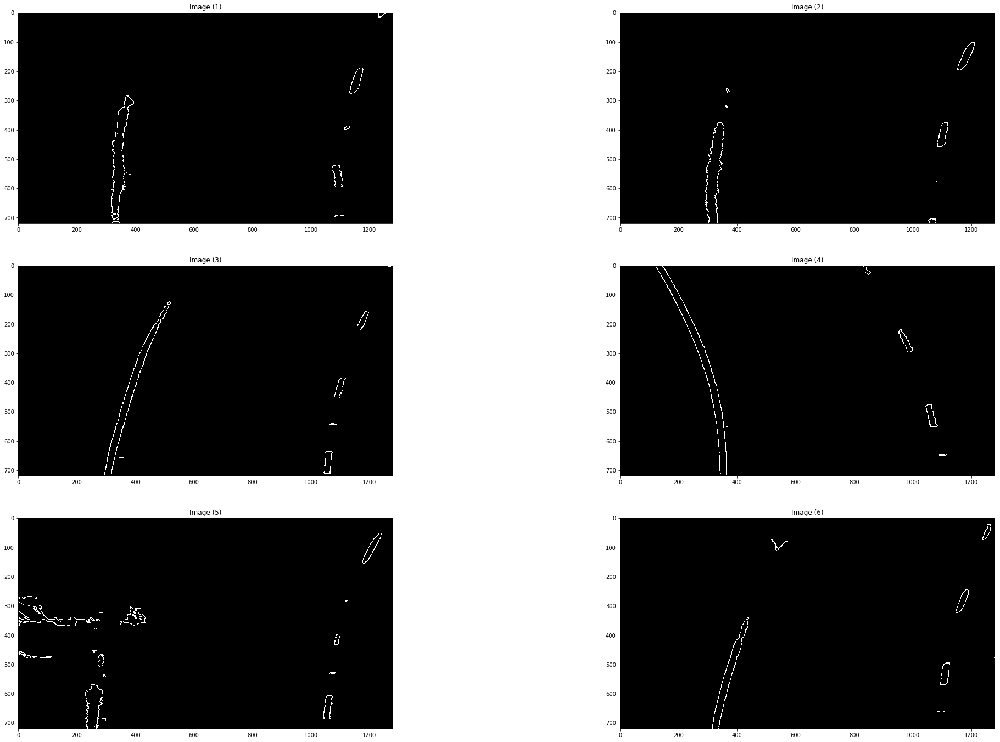

In [24]:
processed_images = []

#preprocess undistort images to get banary test images
for img in test_undist:
    img = warp(toRgb(img), M)
    img = colorTransform(img)
    img = combi(img, (20, 255))
    processed_images.append(img)
    
show_images(processed_images,3)

In [38]:
def getCurvature(curve):
    return ((1 + (2*curve[0]*719*ym_per_pix + curve[1])**2)**1.5) / np.absolute(2*curve[0])

In [45]:
binary_warped = processed_images[2]

In [37]:
import collections

buffer_left = []
buffer_right = []
buffer_curvature_right = []
buffer_curvature_left = []

ym_per_pix = 30/720 # meters per pixel in y dimension
xm_per_pix = 3.7/700 # meters per pixel in x dimension

In [41]:
def findPixels(valid_points, top, bottom, left, right):
    # Identify the nonzero pixels in x and y within the window
    found = ((valid_points[0] >= top) & (valid_points[0] < bottom) & 
        (valid_points[1] >= left) &  (valid_points[1] < right)).nonzero()[0]
    
    return found
        
def getLines(binary_warped):
    global buffer_left, buffer_right, buffer_curvature_left, buffer_curvature_right
    
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    #add depth
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    center = np.int(histogram.shape[0]//2)
    left_max = np.argmax(histogram[:center]) #max pixel index on left, int
    right_max = np.argmax(histogram[center:]) + center #max pixel index on right

    window_count = 10
    window_height = np.int(binary_warped.shape[0]//window_count)
    window_width = 200
    window_left_center = left_max
    window_right_center = right_max
    
    valid_points = binary_warped.nonzero() #coordinates of all non black pixels
    
    count_thresh = 20
    left_lane_index_list = []
    right_lane_index_list = []
    
    for window in range(window_count):
        # define rectangle, right and left part has own
        top = binary_warped.shape[0] - (window+1)*window_height
        bottom = binary_warped.shape[0] - window*window_height        
        left_left = int(window_left_center - (window_width/2))
        left_right = int(window_left_center + (window_width/2))
        right_left = int(window_right_center - (window_width/2))
        right_right = int(window_right_center + (window_width/2))
        
        # define rectangle object
        cv2.rectangle(out_img,(left_left,top),(left_right,bottom),
        (0,255,0), 2) 
        cv2.rectangle(out_img,(right_left,top),(right_right,bottom),
        (0,255,0), 2)
        
        found_left = findPixels(valid_points, top, bottom, left_left, left_right)
        left_lane_index_list.append(found_left)
        
        found_right = findPixels(valid_points, top, bottom, right_left, right_right)
        right_lane_index_list.append(found_right)        
        
        if len(found_left) > count_thresh:
            window_left_center = np.int(np.mean(valid_points[1][found_left]))
                
        if len(found_right) > count_thresh:
            window_right_center = np.int(np.mean(valid_points[1][found_right]))

    # Concatenate the arrays of indices
    left_lane_index_list = np.concatenate(left_lane_index_list)
    right_lane_index_list = np.concatenate(right_lane_index_list)

    # Extract left and right line pixel positions
    leftx = valid_points[1][left_lane_index_list]
    lefty = valid_points[0][left_lane_index_list] 
    rightx = valid_points[1][right_lane_index_list]
    righty = valid_points[0][right_lane_index_list] 

    # create curves by using list of pixel in area of lane line
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    # curves with respect to real world dimensions
    left_fit_meters = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_meters = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)
    
    # Calculate curvature
    leftCurvature = getCurvature(left_fit_meters)
    rightCurvature = getCurvature(right_fit_meters)
        
    #drop big step changes
    diff_left = np.abs(leftCurvature - np.average(buffer_curvature_left)*10)
    if (diff_left > np.average(buffer_curvature_left)*10):
        left_fit = np.average(buffer_left, axis=0)
        
    diff_right = np.abs(rightCurvature - np.average(buffer_curvature_right)*10)
    if (diff_right > np.average(buffer_curvature_right)*10):
        right_fit = np.average(buffer_right, axis=0)
    
    #buffer few last curv eparameters to have smoother progress, magic size of buffer is about 3/4 second
    buffer_left = buffer_left[-17:]
    buffer_right = buffer_right[-17:]
    
    buffer_left.append(left_fit)
    buffer_right.append(right_fit)
    
    left_fit = np.average(buffer_left, axis=0)
    right_fit = np.average(buffer_right, axis=0)
    
    return(left_fit, right_fit,left_fit_meters, right_fit_meters, left_lane_index_list, right_lane_index_list, out_img, valid_points)

In [49]:
buffer_left = []
buffer_right = []
buffer_curvature_right = []
buffer_curvature_left = []

left_fit, right_fit,left_fit_meters, right_fit_meters, left_lane_index_list, right_lane_index_list, out_img, valid_points = getLines(binary_warped)

/home/roso/miniconda3/envs/carnd-term1/lib/python3.5/site-packages/numpy/lib/function_base.py:1128: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis)
/home/roso/miniconda3/envs/carnd-term1/lib/python3.5/site-packages/numpy/core/_methods.py:80: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


(720, 0)

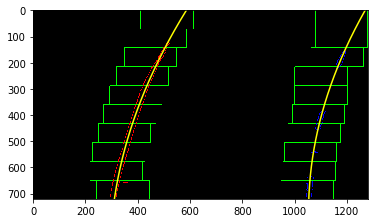

In [50]:
ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

out_img[valid_points[0][left_lane_index_list], valid_points[1][left_lane_index_list]] = [255, 0, 0]
out_img[valid_points[0][right_lane_index_list], valid_points[1][right_lane_index_list]] = [0, 0, 255]
plt.imshow(out_img)
plt.plot(left_fitx, ploty, color='yellow')
plt.plot(right_fitx, ploty, color='yellow')
plt.xlim(0, 1280)
plt.ylim(720, 0)

(720, 0)

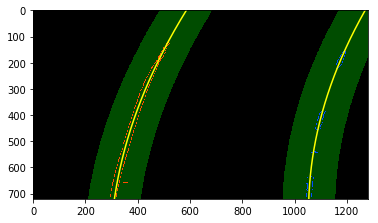

In [52]:
out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
window_img = np.zeros_like(out_img)
out_img[valid_points[0][left_lane_index_list], valid_points[1][left_lane_index_list]] = [255, 0, 0]
out_img[valid_points[0][right_lane_index_list], valid_points[1][right_lane_index_list]] = [0, 0, 255]

left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-100, ploty]))])
left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+100, 
                              ploty])))])
left_line_pts = np.hstack((left_line_window1, left_line_window2))
right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-100, ploty]))])
right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+100, 
                              ploty])))])
right_line_pts = np.hstack((right_line_window1, right_line_window2))


cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
plt.imshow(result)
plt.plot(left_fitx, ploty, color='yellow')
plt.plot(right_fitx, ploty, color='yellow')
plt.xlim(0, 1280)
plt.ylim(720, 0)

In [56]:
y_eval = np.max(ploty)
left_curverad = ((1 + (2*left_fit[0]*y_eval + left_fit[1])**2)**1.5) / np.absolute(2*left_fit[0])
right_curverad = ((1 + (2*right_fit[0]*y_eval + right_fit[1])**2)**1.5) / np.absolute(2*right_fit[0])
print('Curvature parameter for pixel dimensions: \nLeft: {0:.3f}'.format(left_curverad) + '\nRight: {0:.3f}'.format(right_curverad))

Curvature parameter for pixel dimensions: 
Left: 1575.393
Right: 1361.797


In [57]:
def preprocessImage(img):
    img = warp(toRgb(img), M)
    img = colorTransform(img)
    return combi(img, (20, 255))

In [61]:
def addLineToImage(original):
    img = preprocessImage(original)
    left_fit, right_fit,left_fit_meters, right_fit_meters, _,_,_,_ = getLines(img)
    
    yMax = img.shape[0]
    ploty = np.linspace(0, yMax - 1, yMax)
    color_warp = np.zeros_like(original).astype(np.uint8)
    
    # Calculate points.
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    # get coordinates of points
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))
    
    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
    
    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (original.shape[1], original.shape[0]))
    output = cv2.addWeighted(original, 1, newwarp, 0.3, 0)
    
    return cv2.cvtColor(output, cv2.COLOR_BGR2RGB), left_fit_meters, right_fit_meters

/home/roso/miniconda3/envs/carnd-term1/lib/python3.5/site-packages/numpy/lib/function_base.py:1128: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis)
/home/roso/miniconda3/envs/carnd-term1/lib/python3.5/site-packages/numpy/core/_methods.py:80: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


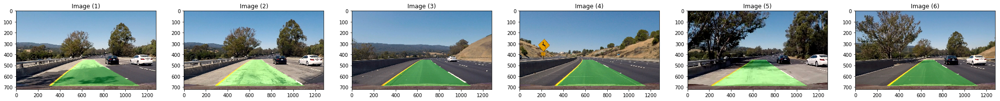

In [63]:
detected_lines = []
buffer_left, buffer_right = [], []
for image in test_images:
    buffer_left = []
    buffer_right = []
    buffer_curvature_right = []
    buffer_curvature_left = []
    imgLines, _, _ = addLineToImage(image)
    detected_lines.append(imgLines)
show_images(detected_lines)

/home/roso/miniconda3/envs/carnd-term1/lib/python3.5/site-packages/numpy/lib/function_base.py:1128: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis)
/home/roso/miniconda3/envs/carnd-term1/lib/python3.5/site-packages/numpy/core/_methods.py:80: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


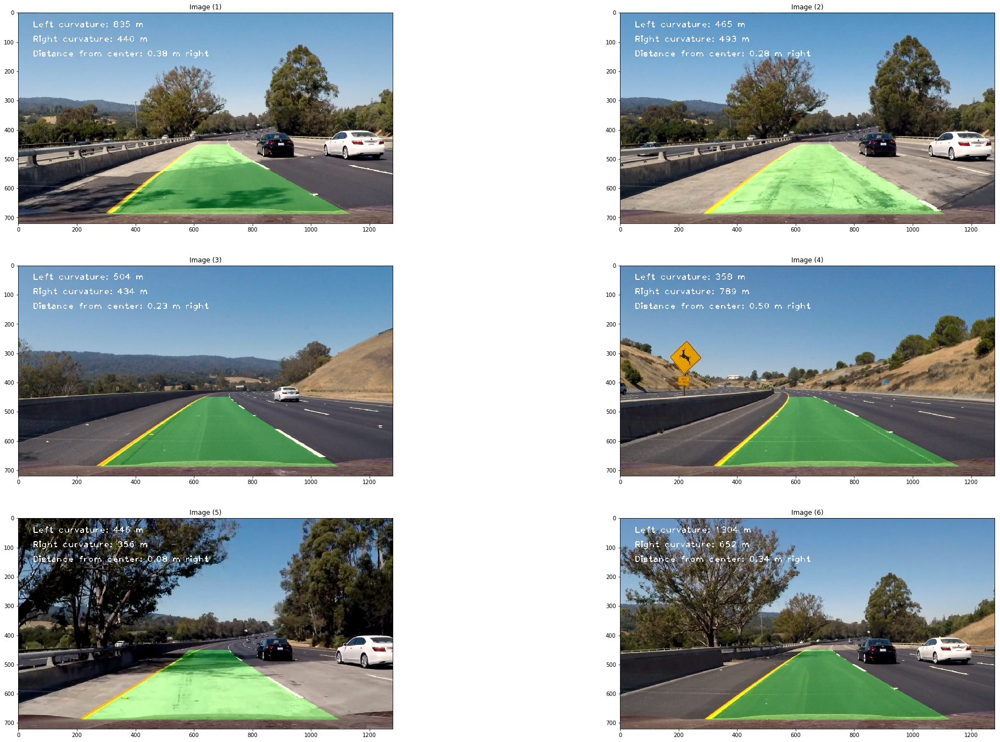

In [64]:
def getLabeledImage(original):
    global buffer_left, buffer_right, buffer_curvature_left, buffer_curvature_right
    output, left_fit_meters, right_fit_meters = addLineToImage(original)
    
    rightCurvature = getCurvature(right_fit_meters)
    leftCurvature = getCurvature(left_fit_meters)
    
    buffer_curvature_left.append(leftCurvature)
    buffer_curvature_right.append(rightCurvature)
    
    buffer_curvature_left = buffer_curvature_left[-24:]
    buffer_curvature_right = buffer_curvature_right[-24:]
            
    # Calculate vehicle center
    xMax = original.shape[1]*xm_per_pix
    yMax = original.shape[0]*ym_per_pix
    vehicleCenter = xMax / 2
    lineLeft = left_fit_meters[0]*yMax**2 + left_fit_meters[1]*yMax + left_fit_meters[2]
    lineRight = right_fit_meters[0]*yMax**2 + right_fit_meters[1]*yMax + right_fit_meters[2]
    lineMiddle = lineLeft + (lineRight - lineLeft)/2
    distance_from_center = lineMiddle - vehicleCenter
    
    # Draw info
    font = cv2.FONT_HERSHEY_PLAIN
    fontColor = (255, 255, 255)
    cv2.putText(output, 'Left curvature: {:.0f} m'.format(leftCurvature), (50, 50), font, 2, fontColor, 2)
    cv2.putText(output, 'Right curvature: {:.0f} m'.format(rightCurvature), (50, 100), font, 2, fontColor, 2)
    cv2.putText(output, 'Distance from center: {} m'.format(distance_from_center), (50, 150), font, 2, fontColor, 2)
    
    return output

resultDisplay = []
    
for image in test_images:
    buffer_left = []
    buffer_right = []
    buffer_curvature_left = []
    buffer_curvature_right = []
    resultDisplay.append(getLabeledImage(image))
show_images(resultDisplay, 3)

In [65]:
from moviepy.editor import VideoFileClip

In [66]:
buffer_left = []
buffer_right = []
buffer_curvature_left = []
buffer_curvature_right = []

def getVideo(inputVideo, outputVideo):
    """
    Process the `inputVideo` frame by frame to find the lane lines, draw curvarute and vehicle position information and
    generate `outputVideo`
    """
    source = VideoFileClip(inputVideo)
        
    def processImage(img):
        return getLabeledImage(cv2.cvtColor(img,cv2.COLOR_RGB2BGR))
    
    clip = source.fl_image(processImage)
    clip.write_videofile(outputVideo, audio=False)

getVideo('project_video.mp4', 'video_output/project_video.mp4')

[MoviePy] >>>> Building video video_output/project_video.mp4
[MoviePy] Writing video video_output/project_video.mp4


100%|█████████▉| 1260/1261 [11:29<00:00,  2.02it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: video_output/project_video.mp4 

